# House Price Prediction Case Study  

## Problem Statement 

A US-based housing company named "Surprise Housing" uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. It has decided to enter the Australian market and so it is looking at prospective properties to buy to enter the market. For this purpose, the company wants to know
- Which factors are significant in predicting the price of a house
- How well those factors describe the price of a house.

Our goal:<br>
To create a regression model for the target variable named "SalePrice" based on collected data set and using regularisation technique in order to predict the actual value of the prospective properties accurately so that it can be decided whether it will be good to invest in those or not. <br>

Business Objective:<br>
- To understand how exactly the SalePrice vary with the features so that this knowledge can be used to concentrate on areas that will yield high returns
- To understand the pricing dynamics of a new market.

## Steps 
1. Reading and cleaning the data
2. EDA Analysis
3. Data preparation for Modeling 
4. Building a regression model and  Model Evaluation 
6. Conclusion/Summary


In [217]:
# import some common libraries 
# Will import specfic libraries as and when required 
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


### 1. Reading and cleaning data

In [293]:
# read data
train_df = pd.read_csv(r"train.csv",sep=",")


In [219]:
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [220]:
#No. of rows and columns 
train_df.shape

(1460, 81)

In [221]:
# Check existence of null value and check data type
train_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [222]:
# Common funcions which will be used multiple times 

#create a function to identify columns having NULL values and to retrun the list of those NULL columns
def check_null (df):
    print("No. of columns having Null value:",len(df.columns[df.isnull().any()]) )
    print("The list of columns having Null value:\n",df.columns[df.isnull().any()]) 
    null_elem = df.isnull().sum()/len(train_df)*100
    null_elem_nonzero = null_elem[null_elem>0]
    null_elem_nonzero.sort_values(inplace=True, ascending=False)
    return null_elem_nonzero

#create a function to identify columns having "0" values and to retrun the list of those columns
def check_zero (df):
    count = (df[df.columns]==0).sum()/len(df)*100
    return count[count>0]

def plot_heatmap(df):
    plt.figure(figsize = (20, 10))
    sns.heatmap(df.corr(), annot = True, cmap="YlGnBu")
    plt.show()


In [223]:
#check the percentage (>0) of elements per column to see the existence of Null
train_df_null_columns = check_null(train_df)
train_df_null_columns

No. of columns having Null value: 19
The list of columns having Null value:
 Index(['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence',
       'MiscFeature'],
      dtype='object')


PoolQC          99.520548
MiscFeature     96.301370
Alley           93.767123
Fence           80.753425
FireplaceQu     47.260274
LotFrontage     17.739726
GarageType       5.547945
GarageYrBlt      5.547945
GarageFinish     5.547945
GarageQual       5.547945
GarageCond       5.547945
BsmtExposure     2.602740
BsmtFinType2     2.602740
BsmtFinType1     2.534247
BsmtCond         2.534247
BsmtQual         2.534247
MasVnrArea       0.547945
MasVnrType       0.547945
Electrical       0.068493
dtype: float64

So, There are lot of missing values reported by Python. The missing data is not good as those will prevent the model to work appropriately. But,.. Are these missing values really missing or have those been wrongly interpreted by Python?? We need to check each such variable mentioned above in metadata and confirm. 

BTW, the variables for which missing data is present, can be classified into two categories:

- Missing values for categorical variables 
- Missing values for numerical variables
   


#### Fixing missing values of categorical variables 

- PoolQC : 'NA" has been considered as Null which is not correct. "NA" is a valid categorical value representing "No Pool". Dataframe needs to be updated accordingly 
- MiscFeature : 'NA" has been considered as Null which is not correct. "NA" is a valid categorical value representing "None". Dataframe needs to be updated accordingly
- Alley : 'NA" has been considered as Null which is not correct. "NA" is a valid categorical value representing "No Alley Access". Dataframe needs to be updated accordingly
- Fence : 'NA" has been considered as Null which is not correct. "NA" is a valid categorical value representing "No Fence". Dataframe needs to be updated accordingly
- FireplaceQu : 'NA" has been considered as Null which is not correct. "NA" is a valid categorical value representing "No Fence". Dataframe needs to be updated accordingly
- GarageType : 'NA" has been considered as Null which is not correct. "NA" is a valid categorical value representing "No Garage". Dataframe needs to be updated accordingly
- GarageFinish : 'NA" has been considered as Null which is not correct. "NA" is a valid categorical value representing "No Garage". Dataframe needs to be updated accordingly
- GarageQual : 'NA" has been considered as Null which is not correct. "NA" is a valid categorical value representing "No Garage". Dataframe needs to be updated accordingly
- GarageCond : 'NA" has been considered as Null which is not correct. "NA" is a valid categorical value representing "No Garage". Dataframe needs to be updated accordingly
- BsmtExposure : 'NA" has been considered as Null which is not correct. "NA" is a valid categorical value representing "No Basement". Dataframe needs to be updated accordingly
- BsmtFinType2 : 'NA" has been considered as Null which is not correct. "NA" is a valid categorical value representing "No Basement". Dataframe needs to be updated accordingly
- BsmtFinType1 : 'NA" has been considered as Null which is not correct. "NA" is a valid categorical value representing "No Basement". Dataframe needs to be updated accordingly
- BsmtCond : 'NA" has been considered as Null which is not correct. "NA" is a valid categorical value representing "No Basement". Dataframe needs to be updated accordingly
- BsmtQual : 'NA" has been considered as Null which is not correct. "NA" is a valid categorical value representing "No Basement". Dataframe needs to be updated accordingly
- MasVnrType : Missing data will be handled by value "None"


In [224]:
# Replace "NA" by appropriate categorical value (mentioned in metadata) 
# for the columns mentioned above so that Python does not consider those as missing values

train_df["PoolQC"].fillna("No Pool",inplace=True)
train_df["MiscFeature"].fillna("None",inplace=True)
train_df["Alley"].fillna("No Alley Access",inplace=True)
train_df["Fence"].fillna("No Fecnce",inplace=True)
train_df["FireplaceQu"].fillna("No Fireplace",inplace=True)
train_df["GarageType"].fillna("No Garage",inplace=True)
train_df["GarageFinish"].fillna("No Garage",inplace=True)
train_df["GarageQual"].fillna("No Garage",inplace=True)
train_df["GarageCond"].fillna("No Garage",inplace=True)
train_df["BsmtExposure"].fillna("No Basement",inplace=True)
train_df["BsmtFinType2"].fillna("No Basement",inplace=True)
train_df["BsmtFinType1"].fillna("No Basement",inplace=True)
train_df["BsmtCond"].fillna("No Basement",inplace=True)
train_df["BsmtQual"].fillna("No Basement",inplace=True)
train_df["MasVnrType"].fillna("None", inplace=True)

In [225]:
#check again - missing values of categorical variables are fixed or not
train_df_null_columns = check_null(train_df)
train_df_null_columns

No. of columns having Null value: 4
The list of columns having Null value:
 Index(['LotFrontage', 'MasVnrArea', 'Electrical', 'GarageYrBlt'], dtype='object')


LotFrontage    17.739726
GarageYrBlt     5.547945
MasVnrArea      0.547945
Electrical      0.068493
dtype: float64

So, missing values of categorical variables are fixed now. Let's focus on remaining numerical variables

In [226]:
# Replace all missing numeric data by corresponding median value 

train_df["LotFrontage"].fillna(train_df["LotFrontage"].median(), inplace=True)
train_df["GarageYrBlt"].fillna(train_df["GarageYrBlt"].median(), inplace=True)
train_df["MasVnrArea"].fillna(train_df["MasVnrArea"].median(), inplace=True)


In [227]:
# Check the existence of Null again 
train_df_null_columns = check_null(train_df)
print(train_df_null_columns)


No. of columns having Null value: 1
The list of columns having Null value:
 Index(['Electrical'], dtype='object')
Electrical    0.068493
dtype: float64


In [228]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          1460 non-null   object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

The above data is showing that all missing values have been taken care

In [229]:
# Let's drop "Id" as it is of no use 
train_df.drop("Id",axis=1,inplace=True)


In [230]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1460 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [231]:
#Now check how many columns have zero value for most of the elements 
cnt = check_zero(train_df)
print(cnt)

MasVnrArea       59.520548
BsmtFinSF1       31.986301
BsmtFinSF2       88.561644
BsmtUnfSF         8.082192
TotalBsmtSF       2.534247
2ndFlrSF         56.780822
LowQualFinSF     98.219178
BsmtFullBath     58.630137
BsmtHalfBath     94.383562
FullBath          0.616438
HalfBath         62.534247
BedroomAbvGr      0.410959
KitchenAbvGr      0.068493
Fireplaces       47.260274
GarageCars        5.547945
GarageArea        5.547945
WoodDeckSF       52.123288
OpenPorchSF      44.931507
EnclosedPorch    85.753425
3SsnPorch        98.356164
ScreenPorch      92.054795
PoolArea         99.520548
MiscVal          96.438356
dtype: float64


In [232]:
#Dropping some columns which has zero (> 90% ) as the most of the values
print("No. of columns before dropping zero columns:",train_df.shape)
train_df.drop(["LowQualFinSF","BsmtHalfBath","3SsnPorch","PoolArea","MiscVal","ScreenPorch"],axis=1,inplace=True)
print("No. of columns after dropping zero columns:",train_df.shape)


No. of columns before dropping zero columns: (1460, 80)
No. of columns after dropping zero columns: (1460, 74)


In [233]:
#Let's check how many columns have zero value for most of the elements 
cnt = check_zero(train_df)
print(cnt)


MasVnrArea       59.520548
BsmtFinSF1       31.986301
BsmtFinSF2       88.561644
BsmtUnfSF         8.082192
TotalBsmtSF       2.534247
2ndFlrSF         56.780822
BsmtFullBath     58.630137
FullBath          0.616438
HalfBath         62.534247
BedroomAbvGr      0.410959
KitchenAbvGr      0.068493
Fireplaces       47.260274
GarageCars        5.547945
GarageArea        5.547945
WoodDeckSF       52.123288
OpenPorchSF      44.931507
EnclosedPorch    85.753425
dtype: float64


In [234]:
### Coverting integer to categorical 
### variable - MSSubClass
train_df.loc[train_df['MSSubClass'] == 20,  'MSSubClass']  = 'ONE_STORY_1946_AND_NEWER'
train_df.loc[train_df['MSSubClass'] == 30,  'MSSubClass']  = 'ONE_STORY_1945_AND_OLDER'
train_df.loc[train_df['MSSubClass'] == 40,  'MSSubClass']  = 'ONE_STORY_WITH_FINISH_ATTIC_ALL_AGES'
train_df.loc[train_df['MSSubClass'] == 45,  'MSSubClass']  = 'ONE_AND_HALF_STORY_UNFINISHED_ALL_AGES'
train_df.loc[train_df['MSSubClass'] == 50,  'MSSubClass']  = 'ONE_AND_HALF_STORY_FINISHED_ALL_AGES'
train_df.loc[train_df['MSSubClass'] == 60,  'MSSubClass']  = 'TWO_STORY_1946_AND_NEWER'
train_df.loc[train_df['MSSubClass'] == 70,  'MSSubClass']  = 'TWO_STORY_1945_AND_OLDER'
train_df.loc[train_df['MSSubClass'] == 75,  'MSSubClass']  = 'TWO_AND HALF_STORY_ALL_AGES'
train_df.loc[train_df['MSSubClass'] == 80,  'MSSubClass']  = 'SPLIT_OR_MULTI_LEVEL'
train_df.loc[train_df['MSSubClass'] == 85,  'MSSubClass']  = 'SPLIT_FOYER'
train_df.loc[train_df['MSSubClass'] == 90,  'MSSubClass']  = 'DUPLEX'
train_df.loc[train_df['MSSubClass'] == 120, 'MSSubClass'] = 'ONE_STORY_PUD'
train_df.loc[train_df['MSSubClass'] == 150, 'MSSubClass'] = 'ONE_AND_HALF_STORY_PUD'
train_df.loc[train_df['MSSubClass'] == 160, 'MSSubClass'] = 'TWO_STORY_PUD'
train_df.loc[train_df['MSSubClass'] == 180, 'MSSubClass'] = 'PUD_MULTIPLEVEL'
train_df.loc[train_df['MSSubClass'] == 190, 'MSSubClass'] = 'TWO_FAMILY_CONVERSION'

### Variable - OverallQual
train_df.loc[train_df['OverallQual'] == 1,  'OverallQual'] = 'VERY_POOR'
train_df.loc[train_df['OverallQual'] == 2,  'OverallQual'] = 'POOR'
train_df.loc[train_df['OverallQual'] == 3,  'OverallQual'] = 'FAIR'
train_df.loc[train_df['OverallQual'] == 4,  'OverallQual'] = 'BELOW_AVERAGE'
train_df.loc[train_df['OverallQual'] == 5,  'OverallQual'] = 'AVERAGE'
train_df.loc[train_df['OverallQual'] == 6,  'OverallQual'] = 'ABOVE_AVERAGE'
train_df.loc[train_df['OverallQual'] == 7,  'OverallQual'] = 'GOOD'
train_df.loc[train_df['OverallQual'] == 8,  'OverallQual'] = 'VERY_GOOD'
train_df.loc[train_df['OverallQual'] == 9,  'OverallQual'] = 'EXCELLENT'
train_df.loc[train_df['OverallQual'] == 10, 'OverallQual'] = 'VERY_EXCELLENT'

### Variable - OverallCond
train_df.loc[train_df['OverallCond'] == 1,  'OverallCond'] = 'VERY_POOR'
train_df.loc[train_df['OverallCond'] == 2,  'OverallCond'] = 'POOR'
train_df.loc[train_df['OverallCond'] == 3,  'OverallCond'] = 'FAIR'
train_df.loc[train_df['OverallCond'] == 4,  'OverallCond'] = 'BELOW_AVERAGE'
train_df.loc[train_df['OverallCond'] == 5,  'OverallCond'] = 'AVERAGE'
train_df.loc[train_df['OverallCond'] == 6,  'OverallCond'] = 'ABOVE_AVERAGE'
train_df.loc[train_df['OverallCond'] == 7,  'OverallCond'] = 'GOOD'
train_df.loc[train_df['OverallCond'] == 8,  'OverallCond'] = 'VERY_GOOD'
train_df.loc[train_df['OverallCond'] == 9,  'OverallCond'] = 'EXCELLENT'
train_df.loc[train_df['OverallCond'] == 10, 'OverallCond'] = 'VERY_EXCELLENT'

### Variable - BsmtFullBath
train_df.loc[train_df['BsmtFullBath'] == 0,  'BsmtFullBath'] = 'NO'
train_df.loc[train_df['BsmtFullBath'] == 1,  'BsmtFullBath'] = 'YES'

### Variable - MoSold
train_df.loc[train_df['MoSold'] == 1,   'MoSold'] = 'JAN'
train_df.loc[train_df['MoSold'] == 2,   'MoSold'] = 'FEB'
train_df.loc[train_df['MoSold'] == 3,   'MoSold'] = 'MAR'
train_df.loc[train_df['MoSold'] == 4,   'MoSold'] = 'APR'
train_df.loc[train_df['MoSold'] == 5,   'MoSold'] = 'MAY'
train_df.loc[train_df['MoSold'] == 6,   'MoSold'] = 'JUN'
train_df.loc[train_df['MoSold'] == 7,   'MoSold'] = 'JUL'
train_df.loc[train_df['MoSold'] == 8,   'MoSold'] = 'AUG'
train_df.loc[train_df['MoSold'] == 9,   'MoSold'] = 'SEP'
train_df.loc[train_df['MoSold'] == 10,  'MoSold'] = 'OCT'
train_df.loc[train_df['MoSold'] == 11,  'MoSold'] = 'NOV'
train_df.loc[train_df['MoSold'] == 12,  'MoSold'] = 'DEC'


In [235]:
train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,OpenPorchSF,EnclosedPorch,PoolQC,Fence,MiscFeature,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,TWO_STORY_1946_AND_NEWER,RL,65.0,8450,Pave,No Alley Access,Reg,Lvl,AllPub,Inside,...,61,0,No Pool,No Fecnce,None,FEB,2008,WD,Normal,208500
1,ONE_STORY_1946_AND_NEWER,RL,80.0,9600,Pave,No Alley Access,Reg,Lvl,AllPub,FR2,...,0,0,No Pool,No Fecnce,None,MAY,2007,WD,Normal,181500
2,TWO_STORY_1946_AND_NEWER,RL,68.0,11250,Pave,No Alley Access,IR1,Lvl,AllPub,Inside,...,42,0,No Pool,No Fecnce,None,SEP,2008,WD,Normal,223500
3,TWO_STORY_1945_AND_OLDER,RL,60.0,9550,Pave,No Alley Access,IR1,Lvl,AllPub,Corner,...,35,272,No Pool,No Fecnce,None,FEB,2006,WD,Abnorml,140000
4,TWO_STORY_1946_AND_NEWER,RL,84.0,14260,Pave,No Alley Access,IR1,Lvl,AllPub,FR2,...,84,0,No Pool,No Fecnce,None,DEC,2008,WD,Normal,250000


### 2. EDA analysis

<Axes: xlabel='SalePrice', ylabel='Density'>

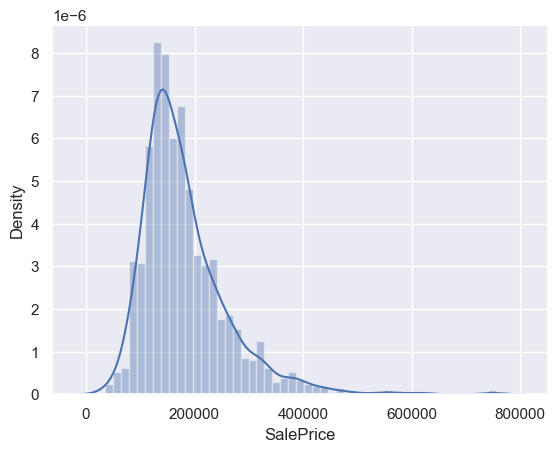

In [236]:
#Check first the distribution of target variable named "SalePrice"
sns.distplot(train_df["SalePrice"])

The above distribution is skewed. Let's use log transformation to make it normal distribution as normal distribution works better in ML

<Axes: xlabel='LogTransformedSalePrice', ylabel='Density'>

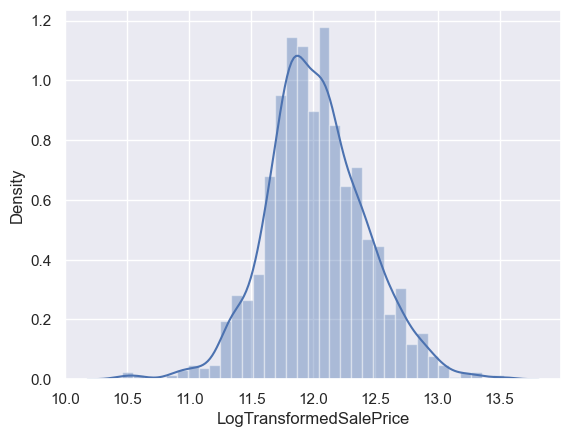

In [237]:
#Log transformation of SalePrice
train_df["LogTransformedSalePrice"] = np.log(train_df["SalePrice"])
sns.distplot(train_df["LogTransformedSalePrice"])

In [238]:
#Drop "SalePrice" as it will not be required. We will use its log transformed version
train_df.drop("SalePrice",axis=1,inplace=True)

Let's use "LogTransformedSalePrice" as new target variable

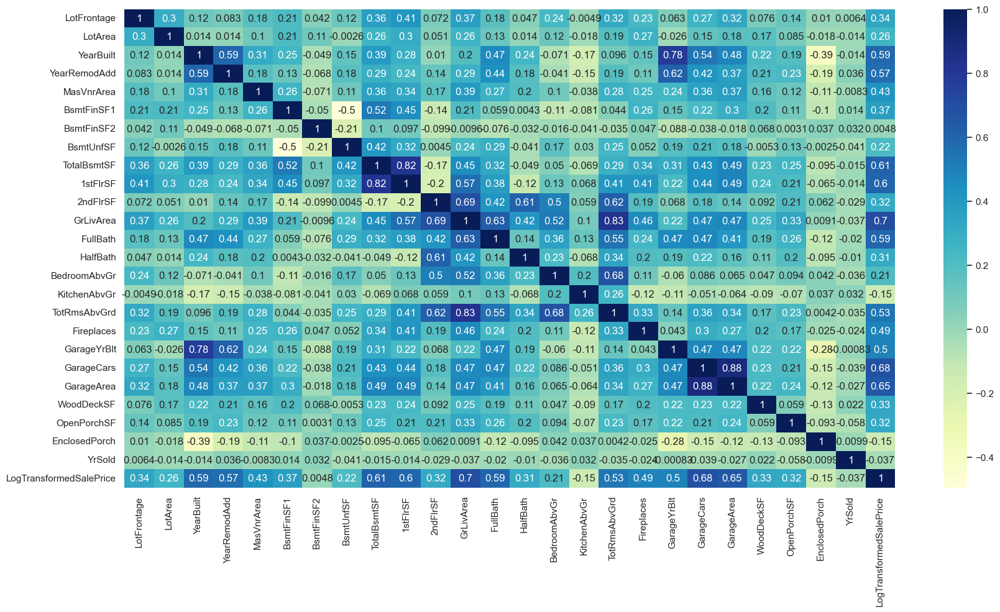

In [239]:
# plot heatmap - Let's check the list of variables corelated well with target variable "SalePrice"
plot_heatmap(train_df)

The above heatmap is shwoing that variables named YearBuilt, YearRemodAdd, MasVntArea, BsmtFinSF1, TotalBsmtSF, 1stFlrSF, GrLivArea, FullBath, TotRmsAbvGrd, GarageCars, GarageArea, Fireplaces have descent corelation with target variable LogTransformedSalePrice. 

LotArea, BsmtFinSF2, BsmtUnfSF, HalfBath, BedroomAbvGr, KitchenAbvGr, EnclosedPorch showing very less corelation with SalePrice, can be dropped

In [240]:
## Drop less correlated variables 
less_corr_var = ["LotArea","BsmtFinSF2","BsmtUnfSF","HalfBath","BedroomAbvGr","KitchenAbvGr","EnclosedPorch"]
train_df.drop(less_corr_var,axis=1,inplace=True)

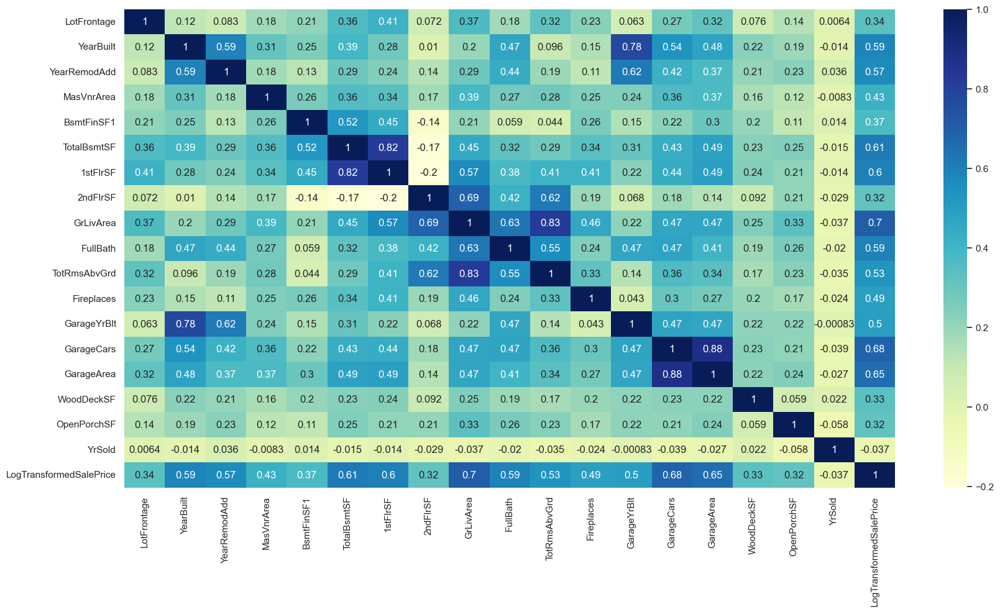

In [241]:
#plot heatmap again
plot_heatmap(train_df)

Correlation looks descent now. 
Lets try some further modification

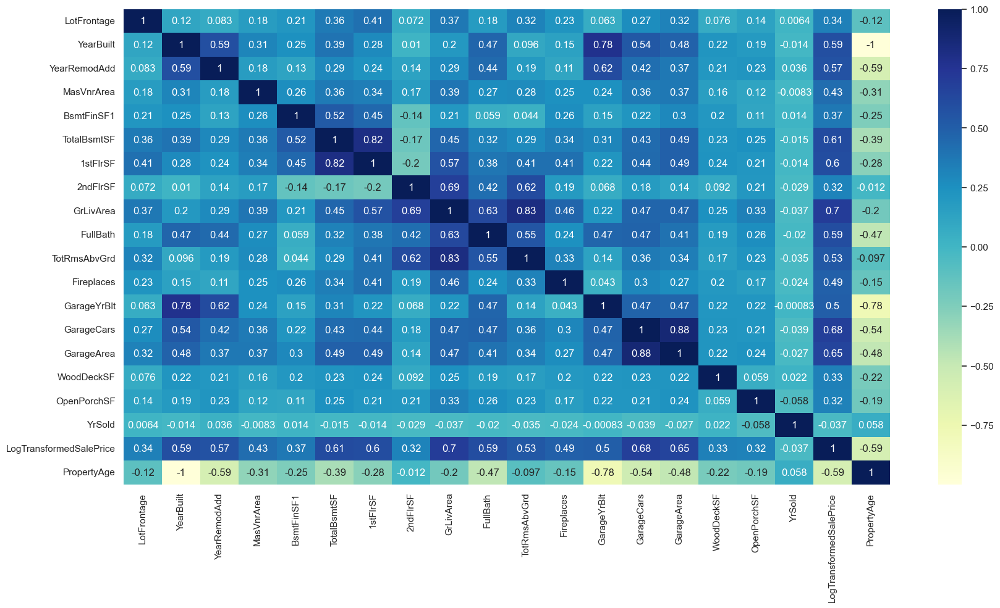

In [242]:
# Let's create a new variable property age
train_df['PropertyAge'] = (train_df['YrSold'] - train_df['YearBuilt'])

#create heatmap again
plot_heatmap(train_df)

"PropertyAge" is showing descent correlation with "SalePrice". Let's keep it and drop "YearBuilt" and "YrSold"

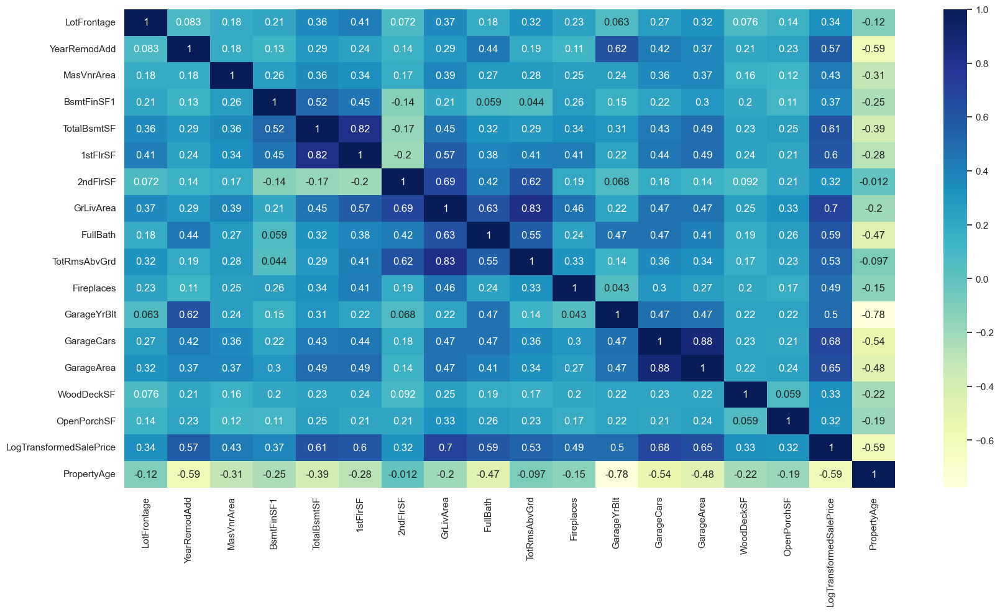

In [243]:
#Drop "YearBuilt", "YrSold"
train_df.drop("YearBuilt",axis=1,inplace=True)
train_df.drop("YrSold",axis=1,inplace=True)

#create heatmap again
plot_heatmap(train_df)

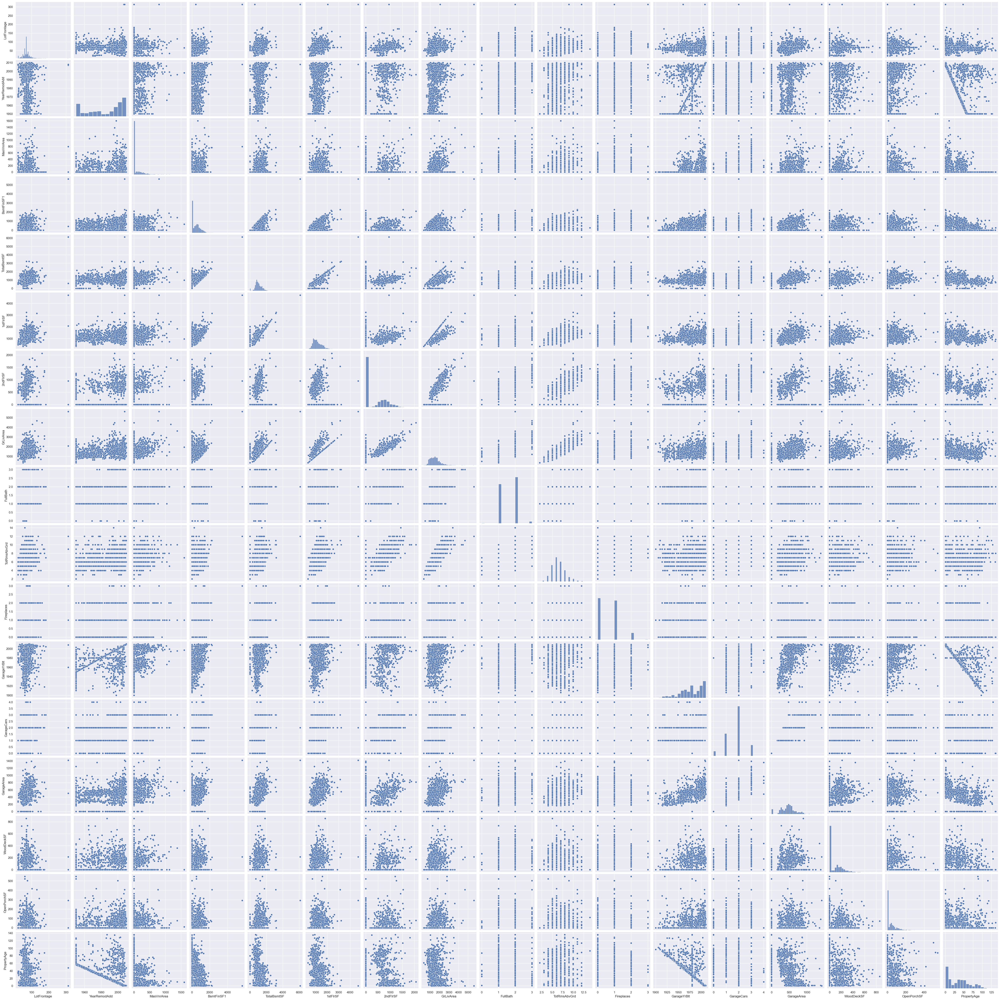

In [244]:
#Let's plot high corelated variables
high_corr_var = ["LotFrontage","YearRemodAdd","MasVnrArea","BsmtFinSF1","TotalBsmtSF","1stFlrSF","2ndFlrSF","GrLivArea","FullBath","TotRmsAbvGrd","Fireplaces","GarageYrBlt","GarageCars","GarageArea","WoodDeckSF","OpenPorchSF","PropertyAge" ]
sns.set()
sns.pairplot(train_df[high_corr_var], size = 3)
plt.show()

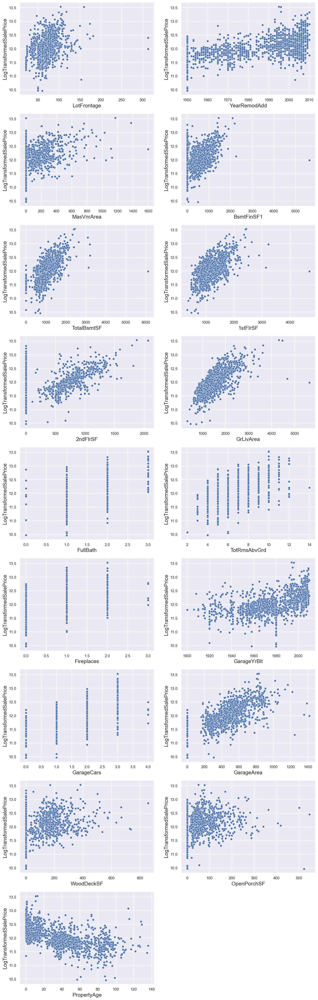

In [245]:
#Plot scatter plot between "LogTransformedSalePrice" and highly correlated variable
plt.figure(figsize=(15,50))
j=1
for i in high_corr_var:
    plt.subplot(round(len(high_corr_var)/2)+1,2,j)
    sns.scatterplot(x=i, y="LogTransformedSalePrice", data=train_df)
    #sns.scatterplot(x=i, y="SalePrice", data=train_df)
    plt.xlabel(i,fontsize=15)
    plt.ylabel("LogTransformedSalePrice",fontsize=15)
    #plt.ylabel("SalePrice",fontsize=15)
    j = j+1
plt.show()

Quick summary on these scatter plots - there are some linear relationship visible between "LogTransformedSalePrice" and  "LotFrontage", "MasVnrArea" , "BsmtFinSF1", "TotalBsmtSF", "1stFlrSF", "2ndFlrSF", "GrLivArea", "GarageArea", "WoodDeckSF", "OpenPorchSF". The "PropertyAge" has some inverse (decreasing order) linear relationship with "LogTransformedSalePrice". 


There are some outliers visible. This can be handled through scaling later

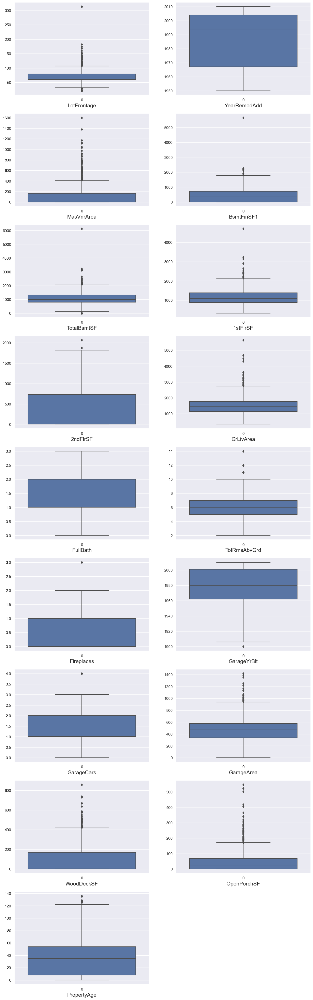

In [246]:
#check existence of outlier for correlated variables using boxplot

plt.figure(figsize=(15,50))
j=1
for i in high_corr_var:
    plt.subplot(round(len(high_corr_var)/2)+1,2,j)
    sns.boxplot(train_df[i])
    plt.xlabel(i,fontsize=15)
    #plt.ylabel("SalePrice",fontsize=15)
    j = j+1
plt.show()

So, there are outliers for correlated variables as visible in boxplot. We will scale before model bulding

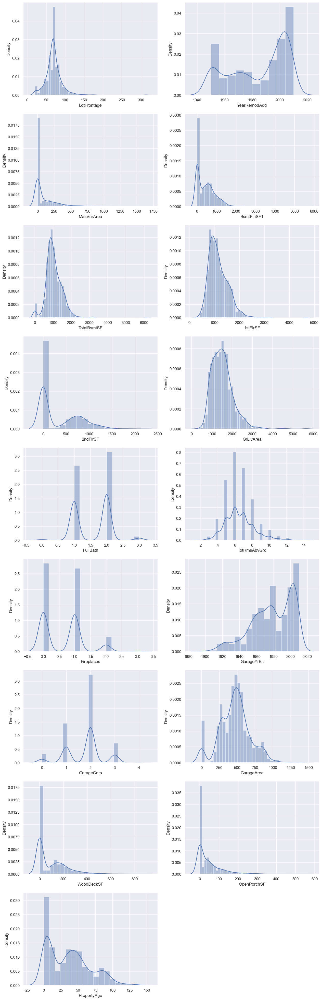

In [247]:
#Distribution check for highly correlated variables
plt.figure(figsize=(15,50))
j=1
for i in high_corr_var:
    plt.subplot(round(len(high_corr_var)/2)+1,2,j)
    sns.distplot(train_df[i])
    j = j+1
plt.show()

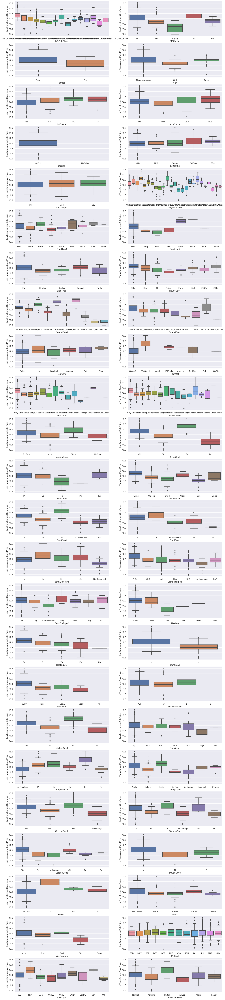

In [248]:
# Plot categorical variables vs output variable

df_categorical = train_df.select_dtypes(include='object').columns
df_categorical
plt.figure(figsize=(20,100))
j=1
for i in df_categorical:
    plt.subplot(round(len(df_categorical)/2)+1,2,j)
    sns.boxplot(x=i,y="LogTransformedSalePrice",data=train_df)
    #sns.boxplot(x=i,y="SalePrice",data=train_df)
    j = j+1
plt.show()

### 3. Data Preparation for Model Building

In [249]:
#Create dummy variables
train_df = pd.get_dummies(train_df, drop_first=True )


In [250]:
train_df.head()

,LotFrontage,YearRemodAdd,MasVnrArea,BsmtFinSF1,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,65.0,2003,196.0,706,856,856,854,1710,2,8,...,0,0,0,0,1,0,0,0,1,0
1,80.0,1976,0.0,978,1262,1262,0,1262,2,6,...,0,0,0,0,1,0,0,0,1,0
2,68.0,2002,162.0,486,920,920,866,1786,2,6,...,0,0,0,0,1,0,0,0,1,0
3,60.0,1970,0.0,216,756,961,756,1717,1,7,...,0,0,0,0,1,0,0,0,0,0
4,84.0,2000,350.0,655,1145,1145,1053,2198,2,9,...,0,0,0,0,1,0,0,0,1,0


In [251]:
# split into train and test
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(train_df, train_size = 0.7, test_size = 0.3, random_state=100)


In [252]:
print("Training set size: ", df_train.shape)
print("Test     set size: ", df_test.shape)


Training set size:  (1021, 286)
Test     set size:  (438, 286)


In [253]:
df_train.describe()

,LotFrontage,YearRemodAdd,MasVnrArea,BsmtFinSF1,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,...,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000
mean,69.544564,1984.938296,104.489716,447.779628,1061.750245,1168.353575,342.672870,1517.025465,1.566112,6.501469,...,0.002938,0.003918,0.078355,0.002938,0.870715,0.002938,0.007835,0.013712,0.825661,0.078355
std,22.079518,20.630577,187.341089,464.934861,459.136602,398.008990,435.299706,532.017383,0.551991,1.605520,...,0.054153,0.062500,0.268860,0.054153,0.335680,0.054153,0.088214,0.116350,0.379587,0.268860
min,21.000000,1950.000000,0.000000,0.000000,0.000000,372.000000,0.000000,438.000000,0.000000,3.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,60.000000,1967.000000,0.000000,0.000000,793.000000,875.000000,0.000000,1134.000000,1.000000,5.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,69.000000,1994.000000,0.000000,392.000000,992.000000,1086.000000,0.000000,1466.000000,2.000000,6.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,78.000000,2004.000000,158.000000,712.000000,1314.000000,1422.000000,727.000000,1768.000000,2.000000,7.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,313.000000,2010.000000,1600.000000,5644.000000,6110.000000,4692.000000,2065.000000,5642.000000,3.000000,14.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


#### Rescaling features
Lets rescale the variables so that they have a comparable scale. If the varibles are not in comparable scale, then some of the coefficients as obtained by fitting the regression model might be very large or very small as compared to the other coefficients. This will create issue during model evaluation.

There are two common ways of rescaling:

Min-Max scaling ( 0 to 1)
Standardisation (mean-0, sigma-1)
We will use MinMax scaling as it takes care of outliers

In [254]:
## Min-Max scaling

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# Training set- create a list of numeric variables 
num_vars = df_train.select_dtypes(exclude=['object']).columns.tolist()

##Fit the data
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])
df_train.describe()


,LotFrontage,YearRemodAdd,MasVnrArea,BsmtFinSF1,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,...,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000,1021.000000
mean,0.166249,0.582305,0.065306,0.079337,0.173773,0.184341,0.165943,0.207345,0.522037,0.318315,...,0.002938,0.003918,0.078355,0.002938,0.870715,0.002938,0.007835,0.013712,0.825661,0.078355
std,0.075615,0.343843,0.117088,0.082377,0.075145,0.092132,0.210799,0.102232,0.183997,0.145956,...,0.054153,0.062500,0.268860,0.054153,0.335680,0.054153,0.088214,0.116350,0.379587,0.268860
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.133562,0.283333,0.000000,0.000000,0.129787,0.116435,0.000000,0.133743,0.333333,0.181818,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,0.164384,0.733333,0.000000,0.069454,0.162357,0.165278,0.000000,0.197540,0.666667,0.272727,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,0.195205,0.900000,0.098750,0.126152,0.215057,0.243056,0.352058,0.255573,0.666667,0.363636,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [255]:
# Test set- create a list of numeric variables 
num_vars = df_test.select_dtypes(exclude=['object']).columns.tolist()

## Transform the data on test data set
df_test[num_vars] = scaler.transform(df_test[num_vars])
df_test.describe()


,LotFrontage,YearRemodAdd,MasVnrArea,BsmtFinSF1,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000,...,438.000000,438.000000,438.000000,438.0,438.000000,438.000000,438.000000,438.000000,438.000000,438.000000
mean,0.169716,0.577816,0.062596,0.076725,0.171395,0.179944,0.172315,0.206127,0.520548,0.322956,...,0.004566,0.002283,0.095890,0.0,0.860731,0.002283,0.009132,0.013699,0.808219,0.102740
std,0.075051,0.345295,0.102883,0.077114,0.063466,0.083128,0.212823,0.098108,0.183086,0.152039,...,0.067496,0.047782,0.294778,0.0,0.346623,0.047782,0.095235,0.116370,0.394152,0.303966
min,0.000000,0.000000,0.000000,0.000000,0.000000,-0.008796,0.000000,-0.019985,0.000000,-0.090909,...,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.133562,0.266667,0.000000,0.000000,0.133061,0.122222,0.000000,0.131293,0.333333,0.181818,...,0.000000,0.000000,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,0.164384,0.716667,0.000000,0.063873,0.161293,0.165856,0.000000,0.195619,0.666667,0.272727,...,0.000000,0.000000,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,0.202055,0.900000,0.108750,0.125753,0.204337,0.224711,0.359201,0.260761,0.666667,0.363636,...,0.000000,0.000000,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,1.000000,1.000000,0.575625,0.387668,0.413093,0.498148,0.769492,0.609147,1.000000,0.818182,...,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [256]:
#Create training and test set
y_train = df_train.pop("LogTransformedSalePrice")
#y_train = df_train.pop("SalePrice")
X_train = df_train
y_test = df_test.pop("LogTransformedSalePrice")
#y_test = df_test.pop("SalePrice")
X_test = df_test

### 4. Model Building  using "ScikitLearn"

In [257]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [258]:
# #Unregularized Model
lm = LinearRegression()
lm.fit(X_train, y_train)
print("Traing R2:")
print(lm.score(X_train,y_train))
print("Test R2:")
print(lm.score(X_test,y_test))

Traing R2:
0.9618407637116854
Test R2:
-7.465873477635209e+20


The model using all of the features is highly overfitting. So, there is a difference in the result when model is applied on training and test data set. We need to apply regularization technique to improve test score. 


In [259]:
# Importing the relevant libraries
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn import linear_model

## Regularization <BR>
Regularization is a process of handling overfitting in the model which happens when Test R2 is very less compared to Training R2 and this happens when there are high no. of features present in the model. There are two popular techniques of regularization:
- Lasso
- Ridge <BR>
    
Both the techniques work by penalizing the magnitude of coefficients of features along with minimizing the error between predictions and actual values or records.


### Lasso 

Lasso Regression can nullify the impact of an irrelevant feature in the data and so it completely eliminates irrelevant features. It works better to reduce the variance when the data consists of many insignificant features. Let's see its impact on the current model

First, start with alpha=0 which means no regularization

In [260]:
# No regularization
lr = Lasso(alpha=0.000)
lr.fit(X_train,y_train)
print("Training R2")
print(lr.score(X_train,y_train))
print("Testing R2")
print(lr.score(X_test,y_test))
Diff = lr.score(X_train,y_train) - lr.score(X_test,y_test)
print("Diff between training and test R2:", Diff)

Training R2
0.9618403323119651
Testing R2
0.6153363357628758
Diff between training and test R2: 0.34650399654908925


Test R2 is much lesser than training R2. So, it is a case of overfitting. <BR>


Let's try to find out the most optimal value of alpha to overcoming overfitting problem. 

In [261]:
#Generate a set of alpha values 
params = {'alpha': np.arange(0, 1, 0.001).tolist()}


In [262]:
# Applying Lasso
lasso = Lasso()

# cross validation
folds = 5
model_cv_lasso = GridSearchCV(estimator = lasso,
                        param_grid = params,
                        scoring= 'r2',
                        cv = folds,
                        return_train_score=True,
                        verbose = 1)

model_cv_lasso.fit(X_train, y_train)

Fitting 5 folds for each of 1000 candidates, totalling 5000 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0, 0.001, 0.002, 0.003, 0.004, 0.005,
                                   0.006, 0.007, 0.008, 0.009000000000000001,
                                   0.01, 0.011, 0.012, 0.013000000000000001,
                                   0.014, 0.015, 0.016, 0.017,
                                   0.018000000000000002, 0.019, 0.02, 0.021,
                                   0.022, 0.023, 0.024, 0.025,
                                   0.026000000000000002, 0.027, 0.028, 0.029, ...]},
             return_train_score=True, scoring='r2', verbose=1)

In [263]:
cv_results_lasso = pd.DataFrame(model_cv_lasso.cv_results_)
cv_results_lasso.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.300124,0.013786,0.005672,0.003996,0.0,{'alpha': 0.0},0.884395,0.655512,0.798776,0.884537,...,0.826320,0.093198,2,0.967548,0.965852,0.966144,0.966438,0.963669,0.965930,0.001268
1,0.017828,0.003713,0.005572,0.003981,0.001,{'alpha': 0.001},0.871741,0.811472,0.810332,0.866113,...,0.840714,0.026062,1,0.863855,0.875590,0.875284,0.859242,0.853001,0.865394,0.008895
2,0.016252,0.003215,0.006655,0.004095,0.002,{'alpha': 0.002},0.841303,0.772391,0.769872,0.812194,...,0.791594,0.030329,3,0.811511,0.819503,0.823681,0.810400,0.798574,0.812734,0.008638
3,0.015104,0.002290,0.005339,0.002526,0.003,{'alpha': 0.003},0.802696,0.727484,0.726302,0.768078,...,0.746685,0.034086,4,0.755208,0.767080,0.769202,0.761370,0.758146,0.762201,0.005270
4,0.016766,0.001668,0.004828,0.002076,0.004,{'alpha': 0.004},0.760991,0.690537,0.684817,0.734000,...,0.707214,0.034959,5,0.710681,0.725370,0.726070,0.722874,0.719763,0.720952,0.005591


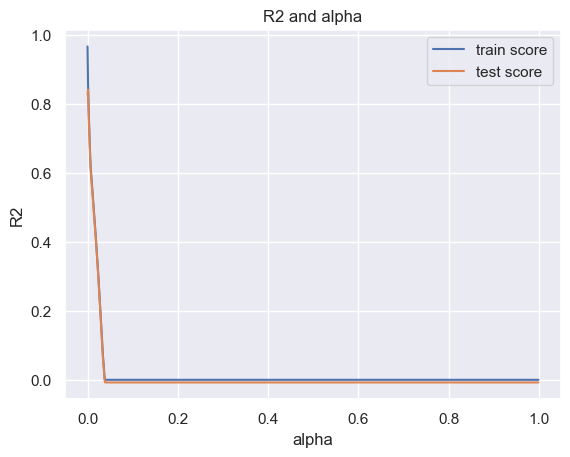

In [264]:
# plotting mean test and train scoes with alpha
cv_results_lasso['param_alpha'] = cv_results_lasso['param_alpha'].astype('float32')

# plotting
plt.plot(cv_results_lasso['param_alpha'], cv_results_lasso['mean_train_score'])
plt.plot(cv_results_lasso['param_alpha'], cv_results_lasso['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('R2')

plt.title("R2 and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [265]:
# get the best estimator for lambda

model_cv_lasso.best_estimator_

Lasso(alpha=0.001)

In [266]:
from sklearn import metrics
lm_lasso = Lasso(alpha=0.001)
lm_lasso.fit(X_train, y_train)

# predict
y_train_pred = lm_lasso.predict(X_train)
r2_score_train = metrics.r2_score(y_true=y_train, y_pred=y_train_pred)
#print("r2_score_train:",metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
print("r2_score_train:",r2_score_train)
y_test_pred = lm_lasso.predict(X_test)
r2_score_test = metrics.r2_score(y_true=y_test, y_pred=y_test_pred)                                
print("r2_score_test:",r2_score_test)
#print("r2_score_test:",metrics.r2_score(y_true=y_test, y_pred=y_test_pred))
print("diff between r2_score_train and r2_score_test:",abs(r2_score_train-r2_score_test))

r2_score_train: 0.8621306864920301
r2_score_test: 0.8308600747150239
diff between r2_score_train and r2_score_test: 0.031270611777006185


In [267]:
print('RMSE :', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred)))

RMSE : 0.054265334094987634


#### Model evaluation - Linearity check between test and predicted data

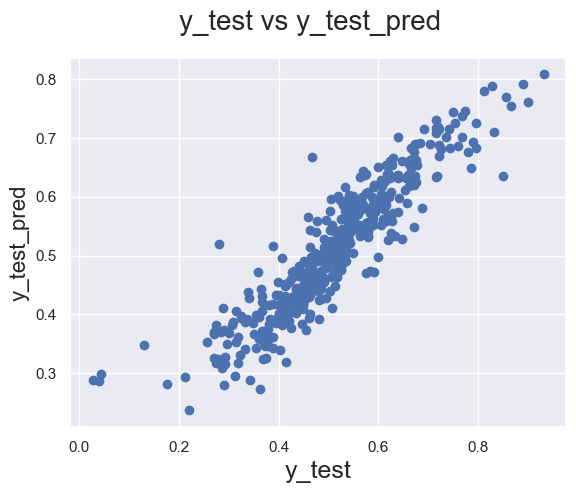

In [268]:
# Plotting y_test and y_pred to understand the spread for Lasso regression.
fig = plt.figure(dpi=100)
plt.scatter(y_test,y_test_pred)
fig.suptitle('y_test vs y_test_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_test_pred', fontsize=16)  
plt.show()

The above plot is showing linear relationship between test data and predicted data. The plot is not of funnel type. This indicates constaint variation and there is not heteroscadasticity... It meets one of the assumtions of the linear model

#### Model evaluation - distribution of error terms

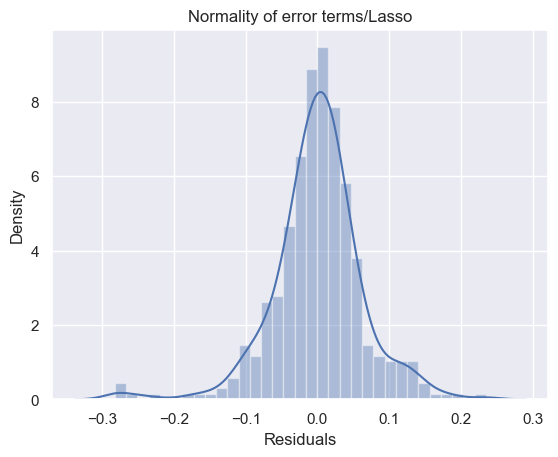

In [292]:
y_res=y_test-y_test_pred
# Distribution of errors
sns.distplot(y_res,kde=True)
plt.title('Normality of error terms/Lasso')
plt.xlabel("Residuals")
plt.show()

The above curve shows that the model residual is normally distributed with mean at 0 .. It meets one of the assumtions of the linear model

In [270]:
lm_lasso.coef_

array([ 0.00000000e+00,  3.98010041e-02,  0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  2.84299763e-01,
        2.53627250e-02,  4.34828893e-02,  0.00000000e+00,  0.00000000e+00,
        8.16827886e-02,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -2.38242580e-02,
        1.12932035e-02, -0.00000000e+00, -0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
        0.00000000e+00,  4.71676408e-03, -0.00000000e+00,  0.00000000e+00,
        0.00000000e+00,  1.52678448e-02, -8.57179523e-03,  0.00000000e+00,
        0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
       -2.30716459e-03,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00,  9.43955507e-03, -0.00000000e+00,  0.00000000e+00,
       -0.00000000e+00,  0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
       -0.00000000e+00,  

Most of the insignificant coefficents is zero in Laso 

In [271]:
lm_lasso.intercept_


0.3020101452181737

In [272]:
# lasso model parameters
model_parameters = list(lm_lasso.coef_ )
model_parameters.insert(0, lm_lasso.intercept_)
model_parameters = [round(x, 6) for x in model_parameters]
cols = X_train.columns
cols = cols.insert(0, "constant")


In [273]:
# Creating a dataframe for the coefficients obtained from Lasso
mod_lasso = list(zip(cols, model_parameters))
para_lasso = pd.DataFrame(mod_lasso)
para_lasso.columns = ['Variable', 'Coeff']
para_lasso.head(5)

,Variable,Coeff
0,constant,0.302010
1,LotFrontage,0.000000
2,YearRemodAdd,0.039801
3,MasVnrArea,0.000000
4,BsmtFinSF1,0.000000


In [274]:
# sort the coefficients in descending order
para_lasso["Coeff_abs"] = abs(para_lasso["Coeff"])
para_lasso = para_lasso.sort_values((['Coeff_abs']), axis = 0, ascending = False)
para_lasso.head(50)


,Variable,Coeff,Coeff_abs
0,constant,0.302010,0.302010
8,GrLivArea,0.284300,0.284300
13,GarageCars,0.081683,0.081683
104,OverallQual_EXCELLENT,0.054716,0.054716
10,TotRmsAbvGrd,0.043483,0.043483
2,YearRemodAdd,0.039801,0.039801
109,OverallQual_VERY_GOOD,0.038624,0.038624
208,CentralAir_Y,0.032260,0.032260
183,BsmtExposure_Gd,0.030303,0.030303
227,FireplaceQu_No Fireplace,-0.029880,0.029880


In [275]:
# Chose variables whose coefficients are non-zero
pred_lasso = pd.DataFrame(para_lasso[(para_lasso['Coeff_abs'] != 0)])
print("Total no of coefficient having value not equal to zero:",len(pred_lasso))
pred_lasso.head(10)

Total no of coefficient having value not equal to zero: 52


,Variable,Coeff,Coeff_abs
0,constant,0.302010,0.302010
8,GrLivArea,0.284300,0.284300
13,GarageCars,0.081683,0.081683
104,OverallQual_EXCELLENT,0.054716,0.054716
10,TotRmsAbvGrd,0.043483,0.043483
2,YearRemodAdd,0.039801,0.039801
109,OverallQual_VERY_GOOD,0.038624,0.038624
208,CentralAir_Y,0.032260,0.032260
183,BsmtExposure_Gd,0.030303,0.030303
227,FireplaceQu_No Fireplace,-0.029880,0.029880


#### Subjective question 1: What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? 

In [276]:
from sklearn import metrics
lm_lasso = Lasso(alpha=0.002)
lm_lasso.fit(X_train, y_train)

# predict
y_train_pred = lm_lasso.predict(X_train)
r2_score_train = metrics.r2_score(y_true=y_train, y_pred=y_train_pred)
#print("r2_score_train:",metrics.r2_score(y_true=y_train, y_pred=y_train_pred))
print("r2_score_train:",r2_score_train)
y_test_pred = lm_lasso.predict(X_test)
r2_score_test = metrics.r2_score(y_true=y_test, y_pred=y_test_pred)                                
print("r2_score_test:",r2_score_test)
#print("r2_score_test:",metrics.r2_score(y_true=y_test, y_pred=y_test_pred))
print("diff between r2_score_train and r2_score_test:",abs(r2_score_train-r2_score_test))

r2_score_train: 0.8108375037559485
r2_score_test: 0.7745172241800786
diff between r2_score_train and r2_score_test: 0.03632027957586992


In [277]:
print('RMSE :', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred)))

RMSE : 0.062655052793683


In [278]:
# lasso model parameters
model_parameters = list(lm_lasso.coef_ )
model_parameters.insert(0, lm_lasso.intercept_)
model_parameters = [round(x, 6) for x in model_parameters]
cols = X_train.columns
cols = cols.insert(0, "constant")

# Creating a dataframe for the coefficients obtained from Lasso
mod_lasso = list(zip(cols, model_parameters))
para_lasso = pd.DataFrame(mod_lasso)
para_lasso.columns = ['Variable', 'Coeff']

# sort the coefficients in descending order
para_lasso["Coeff_abs"] = abs(para_lasso["Coeff"])
para_lasso = para_lasso.sort_values((['Coeff_abs']), axis = 0, ascending = False)

# Chose variables whose coefficients are non-zero
pred_lasso = pd.DataFrame(para_lasso[(para_lasso['Coeff_abs'] != 0)])
print("Total no of coefficient having value not equal to zero:",len(pred_lasso))
pred_lasso.head(20)


Total no of coefficient having value not equal to zero: 39


,Variable,Coeff,Coeff_abs
0,constant,0.384536,0.384536
8,GrLivArea,0.129842,0.129842
13,GarageCars,0.085235,0.085235
10,TotRmsAbvGrd,0.070907,0.070907
2,YearRemodAdd,0.044310,0.044310
227,FireplaceQu_No Fireplace,-0.041870,0.041870
109,OverallQual_VERY_GOOD,0.027801,0.027801
183,BsmtExposure_Gd,0.026353,0.026353
208,CentralAir_Y,0.026079,0.026079
165,ExterQual_TA,-0.023325,0.023325


### Ridge
Ridge regression can not reduce the coefficients to absolute zero. It performs better when the features are expected to be relevant. 

In [279]:
#choose different values of alpha

params_ridge = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

# Applying Ridge
ridge_new = Ridge()


# cross validation
folds = 5
model_cv_ridge = GridSearchCV(estimator = ridge_new,
                        param_grid = params_ridge,
                        scoring= 'neg_mean_absolute_error',
                        cv = folds,
                        return_train_score=True,
                        verbose = 1)
model_cv_ridge.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [280]:
cv_results_ridge = pd.DataFrame(model_cv_ridge.cv_results_)
cv_results_ridge.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.016628,0.002087,0.008662,0.002709,0.0001,{'alpha': 0.0001},-0.030425,-0.031721,-0.032232,-0.030665,...,-0.031087,0.000750,14,-0.017203,-0.017531,-0.017476,-0.017071,-0.017550,-0.017366,0.000193
1,0.017093,0.006926,0.008547,0.001291,0.001,{'alpha': 0.001},-0.030402,-0.031699,-0.032185,-0.030645,...,-0.031058,0.000744,13,-0.017208,-0.017532,-0.017477,-0.017073,-0.017555,-0.017369,0.000193
2,0.017193,0.001035,0.005158,0.001770,0.01,{'alpha': 0.01},-0.030190,-0.031572,-0.031762,-0.030471,...,-0.030817,0.000707,12,-0.017267,-0.017549,-0.017496,-0.017119,-0.017612,-0.017409,0.000186
3,0.017169,0.001396,0.009479,0.001208,0.05,{'alpha': 0.05},-0.029563,-0.031360,-0.031050,-0.029998,...,-0.030316,0.000747,5,-0.017562,-0.017650,-0.017683,-0.017390,-0.017954,-0.017648,0.000184
4,0.015060,0.001848,0.007722,0.001293,0.1,{'alpha': 0.1},-0.029199,-0.031258,-0.030892,-0.029724,...,-0.030108,0.000816,2,-0.017962,-0.017778,-0.017947,-0.017754,-0.018378,-0.017964,0.000224


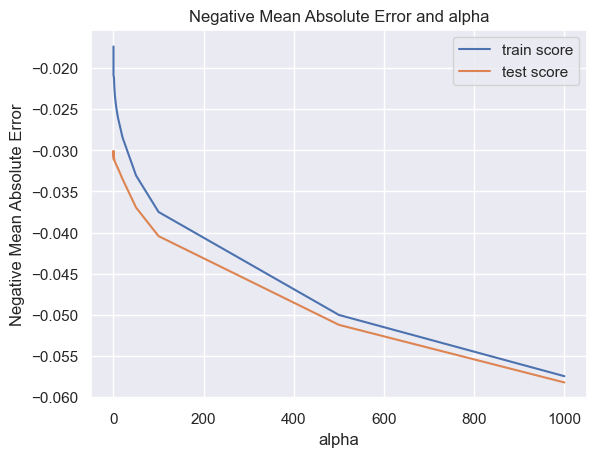

In [281]:
# plotting mean test and train scoes with alpha
cv_results_ridge['param_alpha'] = cv_results_ridge['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results_ridge['param_alpha'], cv_results_ridge['mean_train_score'])
plt.plot(cv_results_ridge['param_alpha'], cv_results_ridge['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show()

In [282]:
from sklearn import metrics
# ridge regression
lm_ridge = Ridge(alpha=50)
lm_ridge.fit(X_train, y_train)

# predict
y_train_pred_ridge = lm_ridge.predict(X_train)
r2_score_train_ridge = metrics.r2_score(y_true=y_train, y_pred=y_train_pred_ridge)
print("r2_score_train_ridge:",r2_score_train_ridge)
y_test_pred_ridge = lm_ridge.predict(X_test)
r2_score_test_ridge = metrics.r2_score(y_true=y_test, y_pred=y_test_pred_ridge)
print("r2_score_test_ridge:",r2_score_test_ridge)
print("Diff between r2_score_train_ridge and r2_score_test_ridge",abs(r2_score_train_ridge-r2_score_test_ridge))

r2_score_train_ridge: 0.8725628328133331
r2_score_test_ridge: 0.8337465365920929
Diff between r2_score_train_ridge and r2_score_test_ridge 0.038816296221240276


In [283]:
print('RMSE :', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred_ridge)))

RMSE : 0.053800308331706785


#### Model Evaluation - Linearity check between test and predicted data 

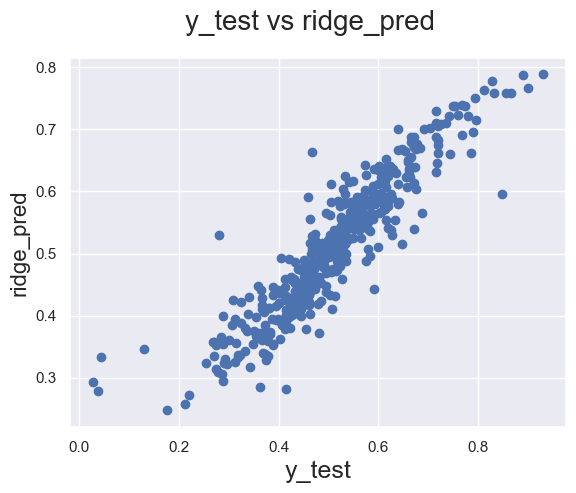

In [284]:
# Plotting y_test and y_pred to understand the spread for ridge regression.
fig = plt.figure(dpi=100)
plt.scatter(y_test,y_test_pred_ridge)
fig.suptitle('y_test vs ridge_pred', fontsize=20)              # Plot heading 
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('ridge_pred', fontsize=16)  
plt.show()

The above plot is showing linear relationship between test data and predicted data. The plot is not of funnel type. This indicates constaint variation and there is not heteroscadasticity... It meets one of the assumtions of the linear model

#### Model Evaluation - Ridge regression error term distribution check 

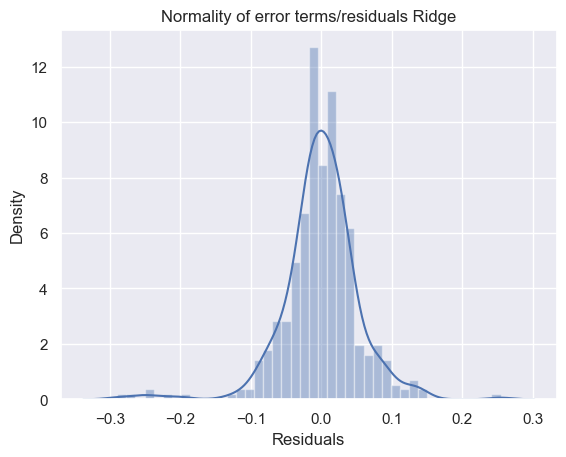

In [285]:
y_res=y_test-y_test_pred_ridge
# Distribution of errors
sns.distplot(y_res,kde=True)
plt.title('Normality of error terms/residuals Ridge')
plt.xlabel("Residuals")
plt.show()

The above curve shows that the model residual is normally distributed with mean at 0 .. It meets one of the assumtions of the linear model

In [286]:
lm_ridge.intercept_

0.3824347025456765

In [287]:
# ridge model parameters
model_parameters_ridge = list(lm_ridge.coef_)
model_parameters_ridge.insert(0, lm_ridge.intercept_)
model_parameters_ridge = [round(x, 3) for x in model_parameters_ridge]
cols = X_train.columns
cols = cols.insert(0, "constant")


In [198]:
# Create a dataframe for Ridge Coefficients
mod_ridge = list(zip(cols, model_parameters_ridge))
para_ridge = pd.DataFrame(mod_ridge)
para_ridge.columns = ['Variable', 'Coeff']
res_ridge = para_ridge.sort_values(by=['Coeff'], ascending = False)
res_ridge.head(5)

,Variable,Coeff
0,constant,0.382
10,TotRmsAbvGrd,0.037
8,GrLivArea,0.033
9,FullBath,0.032
109,OverallQual_VERY_GOOD,0.029


In [288]:
para_ridge = pd.DataFrame(mod_ridge)
para_ridge.columns = ['Variable', 'Coeff']
res_ridge = para_ridge.sort_values(by=['Coeff'], ascending = False)
res_ridge.head(20)

,Variable,Coeff
0,constant,0.415
10,TotRmsAbvGrd,0.026
8,GrLivArea,0.023
109,OverallQual_VERY_GOOD,0.023
9,FullBath,0.023
13,GarageCars,0.022
2,YearRemodAdd,0.022
7,2ndFlrSF,0.020
14,GarageArea,0.019
183,BsmtExposure_Gd,0.019


In [289]:
## Features which are not zero
pred_ridge = pd.DataFrame(para_ridge[(para_ridge['Coeff'] != 0)])
pred_ridge  = pred_ridge.sort_values(by=['Coeff'], ascending = False)
print("Total no of significant coefficient:",len(pred_ridge))
pred_ridge

Total no of significant coefficient: 240


,Variable,Coeff
0,constant,0.415
10,TotRmsAbvGrd,0.026
8,GrLivArea,0.023
109,OverallQual_VERY_GOOD,0.023
9,FullBath,0.023
...,...,...
165,ExterQual_TA,-0.016
103,OverallQual_BELOW_AVERAGE,-0.016
20,MSSubClass_ONE_STORY_1945_AND_OLDER,-0.017
218,KitchenQual_TA,-0.018


#### Subjective question - What will be the changes in the model if you choose double the value of alpha in ridge? 

In [290]:
from sklearn import metrics
# ridge regression
lm_ridge = Ridge(alpha=100)
lm_ridge.fit(X_train, y_train)

# predict
y_train_pred_ridge = lm_ridge.predict(X_train)
r2_score_train_ridge = metrics.r2_score(y_true=y_train, y_pred=y_train_pred_ridge)
print("r2_score_train_ridge:",r2_score_train_ridge)
y_test_pred_ridge = lm_ridge.predict(X_test)
r2_score_test_ridge = metrics.r2_score(y_true=y_test, y_pred=y_test_pred_ridge)
print("r2_score_test_ridge:",r2_score_test_ridge)
print("Diff between r2_score_train_ridge and r2_score_test_ridge",abs(r2_score_train_ridge-r2_score_test_ridge))
print('RMSE :', np.sqrt(metrics.mean_squared_error(y_test, y_test_pred_ridge)))

r2_score_train_ridge: 0.8384526000502895
r2_score_test_ridge: 0.8003510649322969
Diff between r2_score_train_ridge and r2_score_test_ridge 0.038101535117992635
RMSE : 0.05895666556246649


In [291]:
# ridge model parameters
model_parameters_ridge = list(lm_ridge.coef_)
model_parameters_ridge.insert(0, lm_ridge.intercept_)
model_parameters_ridge = [round(x, 3) for x in model_parameters_ridge]
cols = X_train.columns
cols = cols.insert(0, "constant")
#list(zip(cols, model_parameters_ridge))
# Create a dataframe for Ridge Coefficients
mod_ridge = list(zip(cols, model_parameters_ridge))
para_ridge = pd.DataFrame(mod_ridge)
para_ridge.columns = ['Variable', 'Coeff']
# sort the coefficients in descending order
para_ridge["Coeff_abs"] = abs(para_ridge["Coeff"])
para_ridge = para_ridge.sort_values((['Coeff_abs']), axis = 0, ascending = False)
#para_ridge.head(50)
#res_ridge.head(20)
## Features which are not zero
pred_ridge = pd.DataFrame(para_ridge[(para_ridge['Coeff'] != 0)])
pred_ridge  = pred_ridge.sort_values(by=['Coeff'], ascending = False)
print("Total no of significant coefficient:",len(pred_ridge))
pred_ridge.head(30)

Total no of significant coefficient: 240


,Variable,Coeff,Coeff_abs
0,constant,0.415,0.415
10,TotRmsAbvGrd,0.026,0.026
8,GrLivArea,0.023,0.023
109,OverallQual_VERY_GOOD,0.023,0.023
9,FullBath,0.023,0.023
13,GarageCars,0.022,0.022
2,YearRemodAdd,0.022,0.022
7,2ndFlrSF,0.020,0.020
183,BsmtExposure_Gd,0.019,0.019
14,GarageArea,0.019,0.019


## 5. Conclusion/Summary

1. r2 score value comparison (Train set)<BR>

- r2_score_train_ridge: 0.8725628328133331
- r2_score_train_lasso: 0.8621306864920301
    
2. r2 score value comparison (Test set)<BR>
- r2_score_test_ridge: 0.8337465365920929
- r2_score_test_lasso: 0.8308600747150239 <BR>

3. RMSE comparison

- Ridge: 0.053800308331706785
- Lasso: 0.054265334094987634

4. The optimal alpha value in case of Ridge and Lasso is as below:

- Ridge : 50
- Lasso : 0.001

5. No.of coefficients of the features greater than 0:
- Ridge : 240
- Lasso : 52
<BR>
So, Lasso is able to reduce the no of insifnificant features significantly compared to Ridge maintaining similar accuracy

6. Based on Lasso, the features mentioned below will affect "SalePrice" mostly:<BR>

- GrLivArea	
- GarageCars
- OverallQual_EXCELLENT
- TotRmsAbvGrd
- YearRemodAdd
- OverallQual_VERY_GOOD
- CentralAir_Y
- BsmtExposure_Gd
- FireplaceQu_No Fireplace (-ve correlation with 'SalePrice')
- FullBath
- MSSubClass_ONE_STORY_1945_AND_OLDER	(-ve corelation with 'SalePrice')
